# 1 read mudata file from scenicplus output

In [14]:
import warnings
warnings.filterwarnings('ignore')
outDir = '/staging/leuven/stg_00171/Mark/IX_XII_MP_integration/pycistopic_papero/bc_subset_output/scenicplus_out/'
import mudata
scplus_mdata = mudata.read(outDir + "scplusmdata.h5mu")

In [2]:
import scanpy as sc
import anndata
eRegulon_gene_AUC = anndata.concat(
    [scplus_mdata["direct_gene_based_AUC"], scplus_mdata["extended_gene_based_AUC"]],
    axis = 1,
)

eRegulon_gene_AUC.obs = scplus_mdata.obs.loc[eRegulon_gene_AUC.obs_names]

In [58]:
sc.pp.neighbors(eRegulon_gene_AUC, use_rep = "X", n_neighbors=10, n_pcs=30, key_added='neighbors_10_30pcs')

In [59]:
sc.tl.umap(eRegulon_gene_AUC, n_components=30, neighbors_key='neighbors_10_30pcs')
eRegulon_gene_AUC.obsm['UMAP_init'] = eRegulon_gene_AUC.obsm['X_umap']

# 2 add pycistopic umap coordinates

In [3]:
variable = 'coarse_anno'
outDir = '/staging/leuven/stg_00171/Mark/IX_XII_MP_integration/pycistopic_papero/'

import pickle
import os

infile = open(os.path.join(outDir, f"IX_XII_{variable}_cistopic_obj_35topics.pkl"), "rb")
cistopic_obj = pickle.load(infile)
infile.close()

In [4]:
import pandas as pd
pycistopic_umap = pd.DataFrame(cistopic_obj.projections['cell']['UMAP_HARM'])

In [5]:
common_barcodes = eRegulon_gene_AUC.obs.index.intersection(cistopic_obj.cell_data.index)

In [6]:
eRegulon_gene_AUC_sub = eRegulon_gene_AUC[eRegulon_gene_AUC.obs_names.isin(common_barcodes)].copy()

In [7]:
pycistopic_umap_sub = pycistopic_umap.loc[pycistopic_umap.index.isin(common_barcodes)]

In [8]:
# Ensure correct order and alignment
pycistopic_umap_aligned = pycistopic_umap_sub.reindex(eRegulon_gene_AUC_sub.obs_names)

In [9]:
eRegulon_gene_AUC_sub.obsm["pycistopic_umap"] = pycistopic_umap_aligned.values

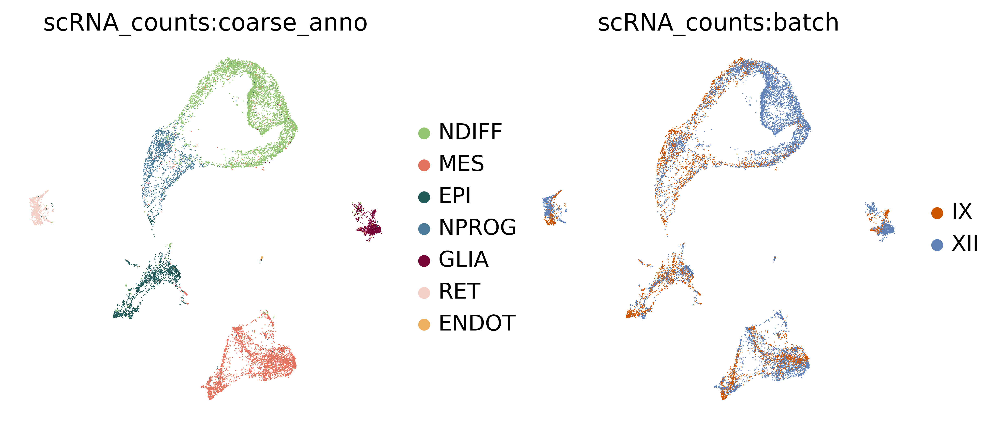

In [10]:
sc.settings.figdir = 'figures/paper/Figure 2/scenicplus_out/'
sc.settings.set_figure_params(dpi=300, frameon=False)

color = ["scRNA_counts:coarse_anno", "scRNA_counts:batch"]
basis = "pycistopic_umap"

color_dic = {
                'MES': '#E3735E',
                'EPI': '#235a5a',
                'GLIA': '#770737',
                'NPROG': '#4a7c99',
                'NDIFF': '#93C572',
                'RET': '#F3CFC6',
                'ENDOT': '#eeaf61',
                 'IX': '#CC5500',
                 'XII': '#6082B6'
            }

sc.pl.embedding(eRegulon_gene_AUC_sub, 
                color=color, 
                basis=basis,
                palette=color_dic,
                size=1.5,
                save= '_coarse_anno_sample.pdf',
               )

In [12]:
outDir = '/staging/leuven/stg_00171/Mark/IX_XII_MP_integration/pycistopic_papero/bc_subset_output/scenicplus_out/'
eRegulon_gene_AUC_sub.write_h5ad(outDir + 'eRegulon_gene_AUC_sub_embryo.h5ad')

In [13]:
direct = scplus_mdata.uns['direct_e_regulon_metadata']

In [14]:
extended = scplus_mdata.uns['extended_e_regulon_metadata']

In [78]:
tf = 'OctVul6B011513'
extended[extended['TF'] == tf]

,Region,Gene,importance_R2G,rho_R2G,importance_x_rho,importance_x_abs_rho,TF,is_extended,eRegulon_name,Gene_signature_name,Region_signature_name,importance_TF2G,regulation,rho_TF2G,triplet_rank


In [68]:
tf = 'OctVul6B031575'
direct[direct['TF'] == tf]

,Region,Gene,importance_R2G,rho_R2G,importance_x_rho,importance_x_abs_rho,TF,is_extended,eRegulon_name,Gene_signature_name,Region_signature_name,importance_TF2G,regulation,rho_TF2G,triplet_rank


# 3 plot neuro regulons, Figure 2

In [13]:
from scenicplus.plotting.dotplot import heatmap_dotplot

In [21]:
f = 'direct'
var = "scRNA_counts:coarse_anno"

subset_feature_names = [
    'OctVul6B025607_direct_+/+', # NPROG, TOPIC 22, ASCL1/2
    'OctVul6B014263_direct_+/+', # NPROG, TOPIC 22, SNAI2
    'OctVul6B027541_direct_+/+', # NPROG, TOPIC 22, E2F
    'OctVul6B028298_direct_+/+', # NDIFF, TOPIC 29, NKX61/62/63
    #'OctVul6B019701_direct_+/+', # NDIFF, TOPIC 29, ftz
    'OctVul6B014489_direct_+/+', # NDIFF, NKX12
    #'OctVul6B007784_direct_+/+', # NDIFF, PO6F1, PO6F2 (pdm3)
    'OctVul6B011661_direct_+/+', # NDIFF, PAX6
    'OctVul6B011691_direct_+/+', # NDIFF, SOX11/12/4
   # 'OctVul6B012600_direct_+/+', # NDIFF, hb    
   # 'OctVul6B015651_direct_-/+', # ERG/FLI --> repressor active in tissues other than NDIFF
   # 'OctVul6B029972_direct_-/+', # SCRT1/2 --? repressor active in tissues other than NPROG and NDIFF
    'OctVul6B025607_direct_-/+' # ASCL1 --> repressor active in tissues other than NPROG, strongest in NDIFF
]

heatmap_dotplot(
    scplus_mudata = scplus_mdata,
    color_modality = f"{f}_gene_based_AUC",
    size_modality = f"{f}_region_based_AUC",
    group_variable = var,
    eRegulon_metadata_key = f"{f}_e_regulon_metadata",
    color_feature_key = "Gene_signature_name",
    size_feature_key = "Region_signature_name",
    feature_name_key = "eRegulon_name",
    subset_feature_names = subset_feature_names,
    sort_data_by = f"{f}_gene_based_AUC",
    orientation = "horizontal",
    figsize = (8, 5),
    save='figures/paper/Figure 2/scenicplus_out/heatmap_direct_N.pdf'
)



In [54]:
f = 'extended'
var = "scRNA_counts:coarse_anno"

subset_feature_names = [
    #'OctVul6B001322_extended_+/+', # NDIFF, BHE22/23 (Oli)
    'OctVul6B005118_extended_+/+', # NDIFF, INSM1/2 
    #'OctVul6B007518_extended_+/+', # NDIFF, PO2F1/2/3 (pdm2)
    #'OctVul6B007760_extended_+/+', # NDIFF, TOPIC29, TBX20
    'OctVul6B011691_extended_+/+', # NDIFF, SOX11/12/4
    #'OctVul6B012600_extended_+/+', # NDIFF, hb
    #'OctVul6B012743_extended_+/+', # NDIFF, TBX6
    'OctVul6B013567_extended_+/+', # NDIFF, TOPIC 10, NKX24/21
    #'OctVul6B020377_extended_+/+', # NDIFF, HOX3, TOPIC29
    'OctVul6B025607_extended_+/+', # NPROG, TOPIC 22
    #'OctVul6B026856_extended_+/+', # NDIFF, LN28A/B
    'OctVul6B027541_extended_+/+',  # NPROG, TOPIC 22, E2F
     'OctVul6B002384_extended_+/+', # TFDP1,TFDP2,TFDP3
    #'OctVul6B027247_extended_+/+', # NDIFF, TOPIC29, MEIS1/2/3
    'OctVul6B031322_extended_+/+', # NDIFF, ONECUT
    'OctVul6B031092_extended_+/+', # NPROG, MYB
    #'OctVul6B008155_extended_-/+' # NDIFF, Hr96
    #'OctVul6B012600_extended_-/+', # other than NDIFF, hb
    'OctVul6B013567_extended_-/+', # other than neuronal diff, NKX21
    'OctVul6B019103_extended_-/+', # SOX13/5/6, active in neuro
    'OctVul6B022688_extended_-/+', # SOX1/2/3, active in GLIA and MES, and final NDIFF
    'OctVul6B025607_extended_-/+', # ASCL1, active other than NPROG, strong in NDIFF
    #'OctVul6B026856_extended_-/+', # LN29A/B, active in MES and GLIA
    'OctVul6B030927_extended_-/+', # GLI1/2/3, active in neuro and GLIA
    'OctVUl6B031322_extended_-/+' # ONECUT, active other than NDIFF
]

heatmap_dotplot(
    scplus_mudata = scplus_mdata,
    color_modality = f"{f}_gene_based_AUC",
    size_modality = f"{f}_region_based_AUC",
    group_variable = var,
    eRegulon_metadata_key = f"{f}_e_regulon_metadata",
    color_feature_key = "Gene_signature_name",
    size_feature_key = "Region_signature_name",
    feature_name_key = "eRegulon_name",
    subset_feature_names = subset_feature_names,
    sort_data_by = f"{f}_gene_based_AUC",
    orientation = "horizontal",
    figsize = (10, 5),
    save='figures/paper/Figure 2/scenicplus_out/heatmap_extended_N.pdf'
)



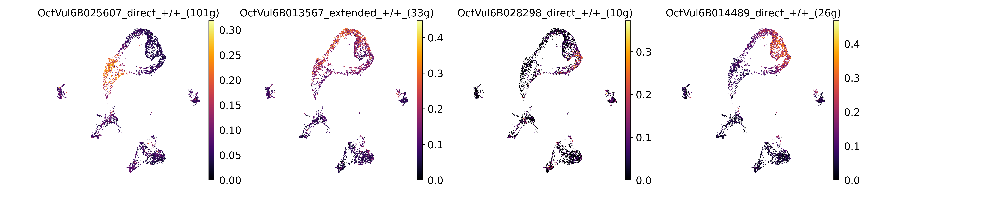

In [48]:
sc.settings.figdir = 'figures/paper/Figure 2/scenicplus_out/'
sc.settings.set_figure_params(dpi=300, frameon=False)

color = [
    'OctVul6B025607_direct_+/+_(101g)', # NPROG, TOPIC 22, ASCL1/2
    'OctVul6B013567_extended_+/+_(33g)', # NDIFF, TOPIC 10, NKX24/21
    'OctVul6B028298_direct_+/+_(10g)', # NDIFF, TOPIC 29, NKX61/62/63
    'OctVul6B014489_direct_+/+_(26g)', # NDIFF, NKX12
]
    
    
basis = "pycistopic_umap"


sc.pl.embedding(eRegulon_gene_AUC_sub, 
                color=color, 
                basis=basis,
                size=2.0,
                cmap='inferno',
                save= '_NKX_regulons.pdf',
               )

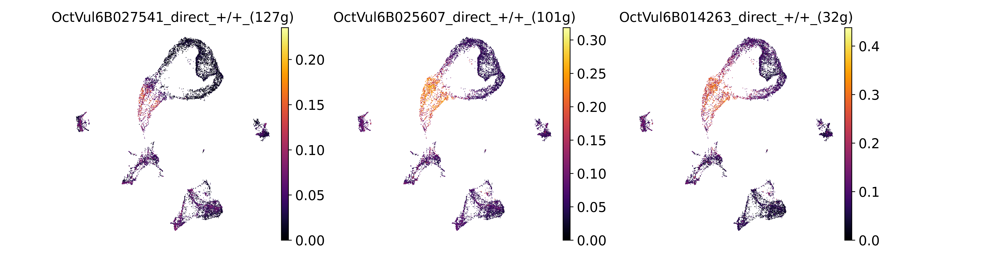

In [ ]:
sc.settings.figdir = 'figures/paper/Figure 2/scenicplus_out/'
sc.settings.set_figure_params(dpi=300, frameon=False)

color = [
    'OctVul6B027541_direct_+/+_(127g)',  # NPROG, TOPIC 22, E2F
    'OctVul6B025607_direct_+/+_(101g)', # NPROG, TOPIC 22, ASCL1/2
    'OctVul6B014263_direct_+/+_(32g)', # NPROG, TOPIC 22, SNAI2
]
    
    
basis = "pycistopic_umap"


sc.pl.embedding(eRegulon_gene_AUC_sub, 
                color=color, 
                basis=basis,
                size=2.0,
                cmap='inferno',
                save= '_NPROG_regulons.pdf',
               )

# 4 plot GLIA regulons, figure 3

In [56]:
from scenicplus.plotting.dotplot import heatmap_dotplot

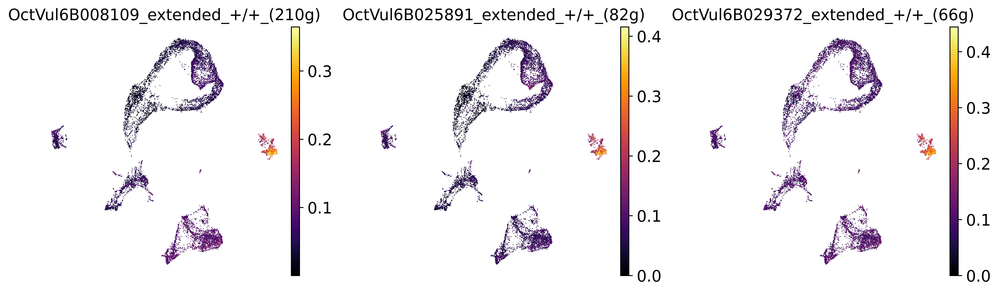

In [13]:
sc.settings.figdir = 'figures/paper/Figure 6/scenicplus_out/'
sc.settings.set_figure_params(dpi=300, frameon=False)

color = [
'OctVul6B008109_extended_+/+_(210g)', # NR4A
'OctVul6B025891_extended_+/+_(82g)', # PROX1/2
'OctVul6B029372_extended_+/+_(66g)', # DLX
]
    
    
basis = "pycistopic_umap"


sc.pl.embedding(eRegulon_gene_AUC_sub, 
                color=color, 
                basis=basis,
                size=2.0,
                cmap='inferno',
                save= '_G_regulons.pdf',
               )

In [74]:
f = 'extended'
var = "scRNA_counts:coarse_anno"

subset_feature_names = [
'OctVul6B008109_extended_+/+', # NR4A
'OctVul6B025891_extended_+/+', # PROX1/2
'OctVul6B029372_extended_+/+', # DLX
]

heatmap_dotplot(
    scplus_mudata = scplus_mdata,
    color_modality = f"{f}_gene_based_AUC",
    size_modality = f"{f}_region_based_AUC",
    group_variable = var,
    eRegulon_metadata_key = f"{f}_e_regulon_metadata",
    color_feature_key = "Gene_signature_name",
    size_feature_key = "Region_signature_name",
    feature_name_key = "eRegulon_name",
    subset_feature_names = subset_feature_names,
    sort_data_by = f"{f}_gene_based_AUC",
    orientation = "horizontal",
    figsize = (10, 8),
    save='figures/paper/Figure 6/scenicplus_out/heatmap_extended_G.pdf'
)



/data/leuven/347/vsc34794/miniconda3/envs/scenicplus/lib/python3.11/site-packages/plotnine/ggplot.py:587: PlotnineWarning: Saving 10 x 8 in image.
/data/leuven/347/vsc34794/miniconda3/envs/scenicplus/lib/python3.11/site-packages/plotnine/ggplot.py:588: PlotnineWarning: Filename: figures/paper/Figure 6/scenicplus_out/heatmap_extended_G.pdf


In [17]:
from scenicplus.plotting.dotplot import heatmap_dotplot

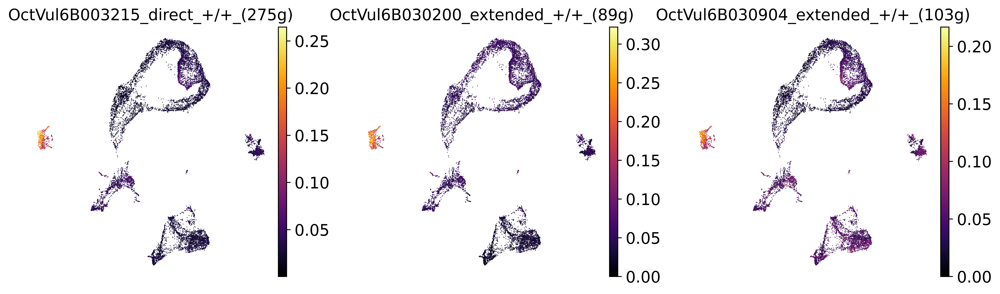

In [15]:
sc.settings.figdir = 'figures/paper/Figure 7/scenicplus_out/'
sc.settings.set_figure_params(dpi=300, frameon=False)

color = [
'OctVul6B003215_direct_+/+_(275g)', # OTX
'OctVul6B030200_extended_+/+_(89g)', # AP2
'OctVul6B030904_extended_+/+_(103g)', # MAFF
]
    
    
basis = "pycistopic_umap"


sc.pl.embedding(eRegulon_gene_AUC_sub, 
                color=color, 
                basis=basis,
                size=2.0,
                cmap='inferno',
                save= '_R_regulons.pdf',
               )

In [29]:
f = 'extended'
var = "scRNA_counts:coarse_anno"

subset_feature_names = [
'OctVul6B003215_extended_+/+', # OTX
'OctVul6B030200_extended_+/+', # AP2
'OctVul6B030904_extended_+/+', # MAFF
]

heatmap_dotplot(
    scplus_mudata = scplus_mdata,
    color_modality = f"{f}_gene_based_AUC",
    size_modality = f"{f}_region_based_AUC",
    group_variable = var,
    eRegulon_metadata_key = f"{f}_e_regulon_metadata",
    color_feature_key = "Gene_signature_name",
    size_feature_key = "Region_signature_name",
    feature_name_key = "eRegulon_name",
    subset_feature_names = subset_feature_names,
    sort_data_by = f"{f}_gene_based_AUC",
    orientation = "horizontal",
    figsize = (6, 4),
    save='figures/paper/Figure 7/scenicplus_out/heatmap_extended_R.pdf'
)



/data/leuven/347/vsc34794/miniconda3/envs/scenicplus/lib/python3.11/site-packages/plotnine/ggplot.py:587: PlotnineWarning: Saving 6 x 4 in image.
/data/leuven/347/vsc34794/miniconda3/envs/scenicplus/lib/python3.11/site-packages/plotnine/ggplot.py:588: PlotnineWarning: Filename: figures/paper/Figure 7/scenicplus_out/heatmap_extended_R.pdf


In [30]:
f = 'direct'
var = "scRNA_counts:coarse_anno"

subset_feature_names = [
'OctVul6B003215_direct_+/+', # OTX
'OctVul6B030200_direct_+/+', # AP2
'OctVul6B030904_direct_+/+', # MAFF
]

heatmap_dotplot(
    scplus_mudata = scplus_mdata,
    color_modality = f"{f}_gene_based_AUC",
    size_modality = f"{f}_region_based_AUC",
    group_variable = var,
    eRegulon_metadata_key = f"{f}_e_regulon_metadata",
    color_feature_key = "Gene_signature_name",
    size_feature_key = "Region_signature_name",
    feature_name_key = "eRegulon_name",
    subset_feature_names = subset_feature_names,
    sort_data_by = f"{f}_gene_based_AUC",
    orientation = "horizontal",
    figsize = (4, 4),
    save='figures/paper/Figure 7/scenicplus_out/heatmap_direct_R.pdf'
)



/data/leuven/347/vsc34794/miniconda3/envs/scenicplus/lib/python3.11/site-packages/plotnine/ggplot.py:587: PlotnineWarning: Saving 4 x 4 in image.
/data/leuven/347/vsc34794/miniconda3/envs/scenicplus/lib/python3.11/site-packages/plotnine/ggplot.py:588: PlotnineWarning: Filename: figures/paper/Figure 7/scenicplus_out/heatmap_direct_R.pdf


# 5 create glia subset of eRegulon_AUC adata object 
umap like the pycistopic object

In [34]:
outDir = '/staging/leuven/stg_00171/Mark/IX_XII_MP_integration/paper_subsets/'

import pickle
import os

infile = open(os.path.join(outDir, "G_cistopic_obj_subset_UMAP_RED.pkl"), "rb")
cistopic_obj = pickle.load(infile)
infile.close()

In [35]:
import pandas as pd
pycistopic_umap = pd.DataFrame(cistopic_obj.projections['cell']['UMAP_HARM'])

In [36]:
common_barcodes = eRegulon_gene_AUC.obs.index.intersection(cistopic_obj.cell_data.index)

In [37]:
eRegulon_gene_AUC_sub = eRegulon_gene_AUC[eRegulon_gene_AUC.obs_names.isin(common_barcodes)].copy()

In [38]:
pycistopic_umap_sub = pycistopic_umap.loc[pycistopic_umap.index.isin(common_barcodes)]

In [39]:
# Ensure correct order and alignment
pycistopic_umap_aligned = pycistopic_umap_sub.reindex(eRegulon_gene_AUC_sub.obs_names)

In [40]:
eRegulon_gene_AUC_sub.obsm["pycistopic_umap"] = pycistopic_umap_aligned.values

# 6 leiden clustering for glia subset

In [97]:
res=0.01
basis = "pycistopic_umap"
neighbors_key = f'neighbors_10_{basis}'
key_added= f'leiden_{res}'

sc.tl.leiden(
            eRegulon_gene_AUC_sub,
            resolution=res,
            random_state=0,
            n_iterations=2,
            directed=False,
            neighbors_key=neighbors_key,  # Use the correct neighbors_key
            key_added=key_added  # Unique key for each reduction-resolution combo
        )

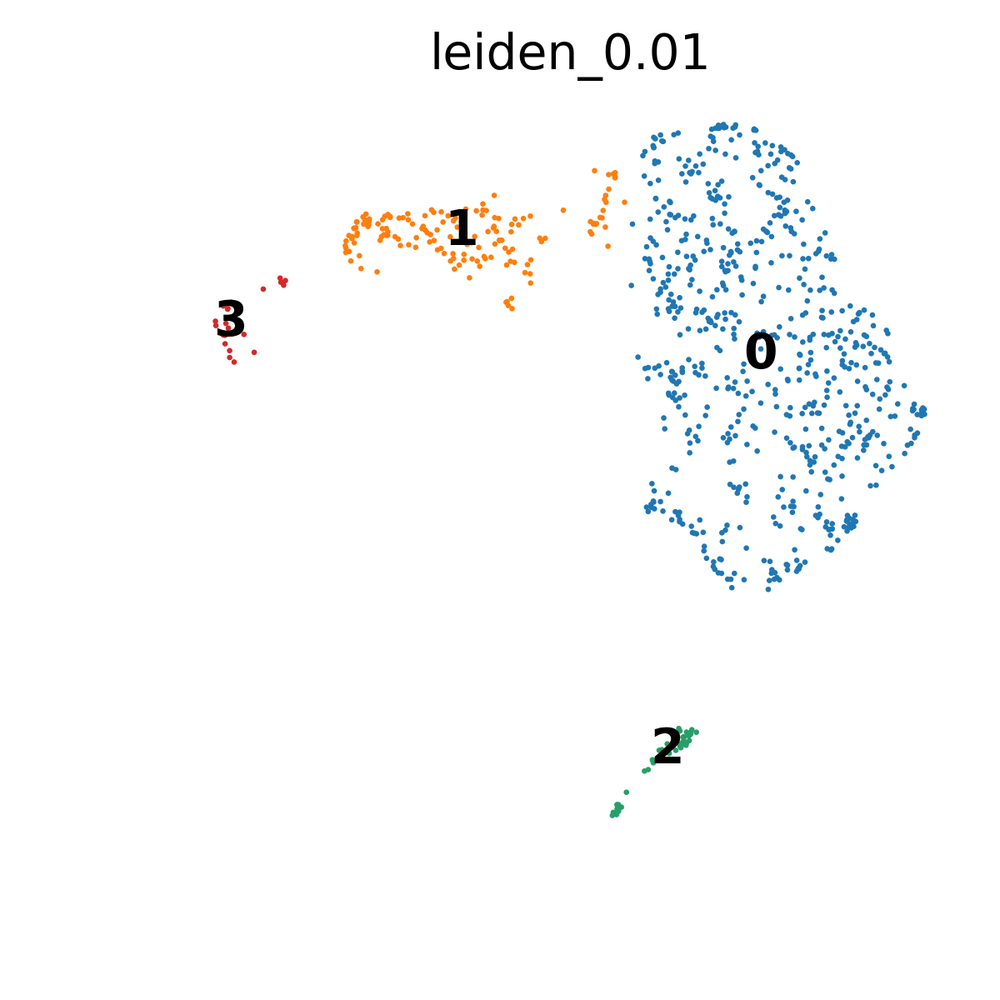

In [98]:
sc.settings.figdir = 'figures/paper/Figure 6/scenicplus_out/'
sc.settings.set_figure_params(dpi=150, frameon=False)

res = 0.01
color = f'leiden_{res}'
basis = "pycistopic_umap"


sc.pl.embedding(eRegulon_gene_AUC_sub, 
                color=color, 
                basis=basis,
                #palette=color_dic,
                size=10.0,
                save= f'_Gsub_leiden_{res}.png',
                legend_loc='on data'
               )

In [156]:
new_clusters = {'0':'glial_1', '1': 'glial_2', '2': 'glial_3', '3': 'glial_2'}

eRegulon_gene_AUC_sub.obs['glia_sub_anno'] = eRegulon_gene_AUC_sub.obs['leiden_0.01'].replace(new_clusters)

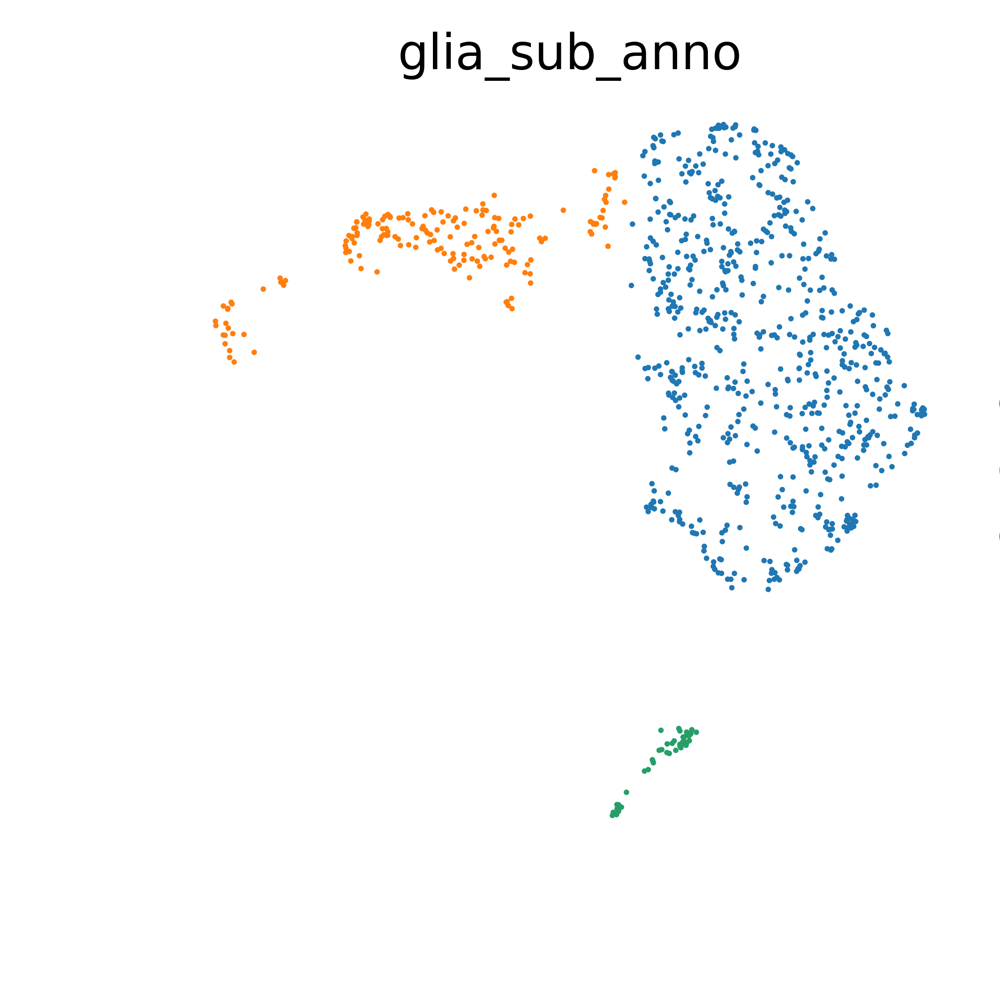

In [157]:
sc.settings.figdir = 'figures/paper/Figure 6/scenicplus_out/'
sc.settings.set_figure_params(dpi=300, frameon=False)

color = 'glia_sub_anno'
basis = "pycistopic_umap"


sc.pl.embedding(eRegulon_gene_AUC_sub, 
                color=color, 
                basis=basis,
                #palette=color_dic,
                size=10.0,
                save= f'_Gsub_{color}.png',
                #legend_loc='on data'
               )

In [158]:
outDir = '/staging/leuven/stg_00171/Mark/IX_XII_MP_integration/pycistopic_papero/bc_subset_output/scenicplus_out/'
eRegulon_gene_AUC_sub.write_h5ad(outDir + 'eRegulon_gene_AUC_sub_G.h5ad')

# 7 batch contributions to the glia annotation

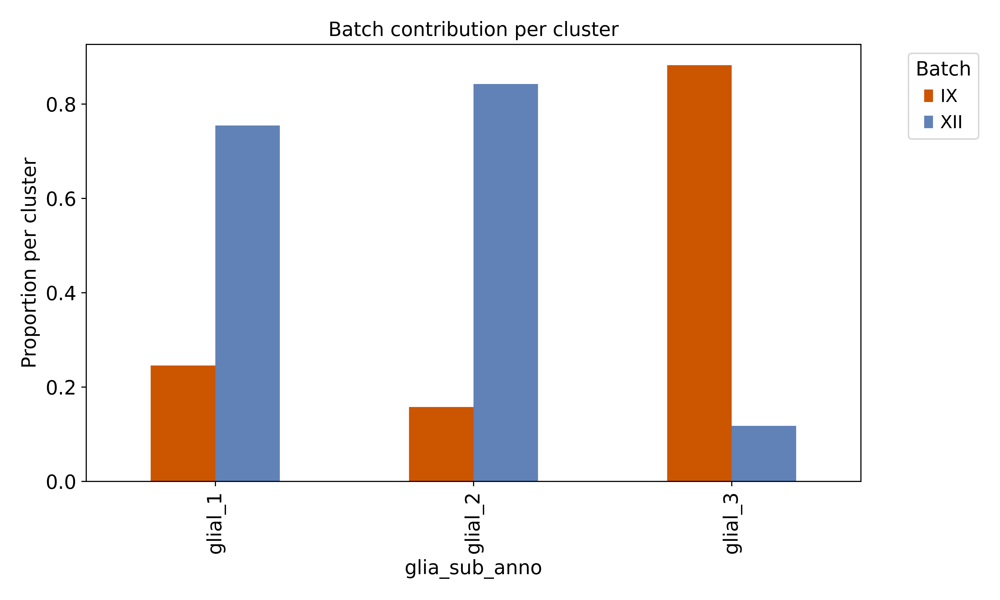

In [159]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import os

cluster_col = 'glia_sub_anno'
batch_col = 'scRNA_counts:batch'
adata = eRegulon_gene_AUC_sub

# Create a contingency table: number of cells per (cluster, batch)
contingency = pd.crosstab(adata.obs[cluster_col], adata.obs[batch_col])

# Normalize to proportions (per cluster)
proportions = contingency.div(contingency.sum(axis=1), axis=0)

# Plot
proportions.plot(kind='bar', stacked=False, figsize=(10,6), color=['#CC5500','#6082B6', '#8A9A5B'])
plt.ylabel('Proportion per cluster')
plt.title('Batch contribution per cluster')
plt.legend(title='Batch', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
plt.grid(False)
plt.savefig('figures/paper/Figure 6/scenicplus_out/G_batch_contribution_glia_sub_anno.pdf', dpi=300)
plt.show()

# 8 create glia mudata for heatmap dotplot

In [22]:
outDir = '/staging/leuven/stg_00171/Mark/IX_XII_MP_integration/pycistopic_papero/bc_subset_output/scenicplus_out/'
eRegulon_gene_AUC_sub = sc.read_h5ad(outDir + 'eRegulon_gene_AUC_sub_G.h5ad')

In [15]:
scplus_mdata_glia = scplus_mdata[scplus_mdata['scRNA_counts'].obs['coarse_anno'].isin(['GLIA'])]

In [16]:
common_barcodes = eRegulon_gene_AUC_sub.obs.index.intersection(scplus_mdata_glia.obs.index)

In [17]:
scplus_mdata_glia_sub = scplus_mdata_glia[scplus_mdata_glia.obs_names.isin(common_barcodes)].copy()

In [18]:
import pandas as pd
reduction = 'pycistopic_umap'

glia_umap = pd.DataFrame(
    eRegulon_gene_AUC_sub.obsm[reduction],
    index=eRegulon_gene_AUC_sub.obs_names,
    columns=["UMAP1", "UMAP2"]
)

In [19]:
glia_umap_sub = glia_umap.loc[glia_umap.index.isin(common_barcodes)]

In [20]:
# Ensure correct order and alignment
glia_umap_aligned = glia_umap_sub.reindex(scplus_mdata_glia_sub.obs_names)

In [21]:
scplus_mdata_glia_sub.obsm['pycistopic_umap'] = glia_umap_aligned.values

In [22]:
scplus_mdata_glia_sub.uns = scplus_mdata.uns

# 9 plot regulons for the glia subclusters

In [12]:
from scenicplus.plotting.dotplot import heatmap_dotplot

In [14]:
res = 0.01
scplus_mdata_glia_sub.obs[f'glia_leiden_{res}'] = eRegulon_gene_AUC_sub.obs[f'leiden_{res}']

In [30]:
scplus_mdata_glia_sub.obs['glia_sub_anno'] = eRegulon_gene_AUC_sub.obs['glia_sub_anno']

In [2]:
import scanpy as sc
outDir = '/staging/leuven/stg_00171/Mark/IX_XII_MP_integration/pycistopic_papero/bc_subset_output/scenicplus_out/'
eRegulon_gene_AUC_sub = sc.read_h5ad(outDir + 'eRegulon_gene_AUC_sub_G.h5ad')

In [113]:
direct = scplus_mdata.uns['direct_e_regulon_metadata']
gene_regulons = direct['Gene_signature_name'].drop_duplicates()
gene_regulons_filtered = gene_regulons[~gene_regulons.str.contains(r"\+/-|-/-", regex=True)]

In [114]:
extended = scplus_mdata.uns['extended_e_regulon_metadata']
gene_regulons = extended['Gene_signature_name'].drop_duplicates()
gene_regulons_filtered = gene_regulons[~gene_regulons.str.contains(r"\+/-|-/-", regex=True)]

In [127]:
direct = scplus_mdata.uns['direct_e_regulon_metadata']['eRegulon_name']
direct = direct.drop_duplicates()
direct = direct[~direct.str.contains(r"\+/-|-/-", regex=True)]

In [128]:
extended = scplus_mdata.uns['extended_e_regulon_metadata']['eRegulon_name']
extended = extended.drop_duplicates()
extended = extended[~extended.str.contains(r"\+/-|-/-", regex=True)]

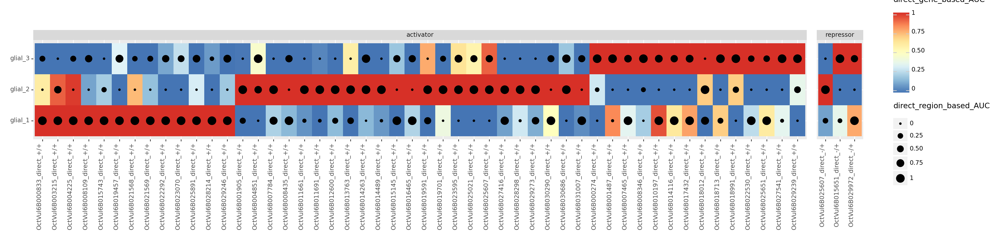

<Figure Size: (2000 x 500)>

In [163]:
f = 'direct'
var = "glia_sub_anno"

heatmap_dotplot(
    scplus_mudata = scplus_mdata_glia_sub,
    color_modality = f"{f}_gene_based_AUC",
    size_modality = f"{f}_region_based_AUC",
    group_variable = var,
    eRegulon_metadata_key = f"{f}_e_regulon_metadata",
    color_feature_key = "Gene_signature_name",
    size_feature_key = "Region_signature_name",
    feature_name_key = "eRegulon_name",
    subset_feature_names = direct,
    sort_data_by = f"{f}_gene_based_AUC",
    orientation = "horizontal",
    figsize = (20, 5),
    #save='figures/paper/Figure 6/scenicplus_out/heatmap_extended_G_sub.pdf'
)


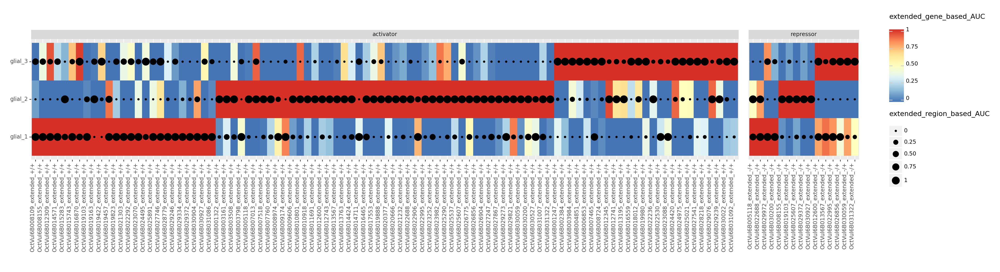

<Figure Size: (2200 x 600)>

In [164]:
f = 'extended'
var = "glia_sub_anno"

heatmap_dotplot(
    scplus_mudata = scplus_mdata_glia_sub,
    color_modality = f"{f}_gene_based_AUC",
    size_modality = f"{f}_region_based_AUC",
    group_variable = var,
    eRegulon_metadata_key = f"{f}_e_regulon_metadata",
    color_feature_key = "Gene_signature_name",
    size_feature_key = "Region_signature_name", 
    feature_name_key = "eRegulon_name",
    subset_feature_names = extended,
    sort_data_by = f"{f}_gene_based_AUC",
    orientation = "horizontal",
    figsize = (22, 6),
    #save='figures/paper/Figure 6/scenicplus_out/heatmap_extended_G_sub.pdf'
)


In [46]:
subset_feature_names = [
    'OctVul6B008109_extended_+/+', # NR4A
    'OctVul6B025891_extended_+/+', # PROX1/2
    'OctVul6B029372_extended_+/+', # DLX
   # 'OctVul6B001322_extended_+/+', # NDIFF, BHE22/23 (Oli)
    'OctVul6B005118_extended_+/+', # NDIFF, INSM1/2 
    'OctVul6B031322_extended_+/+', # NDIFF, ONECUT
   # 'OctVul6B007518_extended_+/+', # NDIFF, PO2F1/2/3 (pdm2)
    'OctVul6B011691_extended_+/+', # NDIFF, SOX11/12/4
    'OctVul6B013567_extended_+/+', # NDIFF, TOPIC 10, NKX24/21
    'OctVul6B025607_extended_+/+', # ASCL1
   # 'OctVul6B027247_extended_+/+', # NDIFF, TOPIC29, MEIS1/2/3
    'OctVul6B027541_extended_+/+',  # NPROG, TOPIC 22, E2F
   # 'OctVul6B001247_extended_+/+', # NRF1
    'OctVul6B002384_extended_+/+', # TFDP1,TFDP2,TFDP3
    #'OctVul6B003984_extended_+/+',
    #'OctVul6B004851_extended_+/+', # ATF1,CREB1,CREM
    #'OctVul6B006853_extended_+/+', # SMC3
   # 'OctVul6B007465_extended_+/+', # RXRA,RXRB,RXRG
    #'OctVul6B008724_extended_+/+', # RAD21,RD21L
    #'OctVul6B012345_extended_+/+',
    #'OctVul6B012741_extended_+/+',
    #'OctVul6B013195_extended_+/+',
    #'OctVul6B016559_extended_+/+', # RFX1,RFX2,RFX3
    #'OctVul6B018012_extended_+/+',
   # 'OctVul6B019980_extended_+/+', # E2F4,E2F5
    #'OctVul6B022236_extended_+/+',
    #'OctVul6B022530_extended_+/+',
    #'OctVul6B023088_extended_+/+',
    #'OctVul6B024420_extended_+/+',
    #'OctVul6B024975_extended_+/+',
    #'OctVul6B025021_extended_+/+',
    'OctVul6B027541_extended_+/+', # E2F1,E2F2,E2F3,E2F6
    #'OctVul6B028218_extended_+/+',
    #'OctVul6B029076_extended_+/+',
    #'OctVul6B029239_extended_+/+',
    #'OctVul6B030022_extended_+/+', # NFYA
    'OctVul6B031092_extended_+/+', # MYB,MYBA,MYBB
    'OctVul6B005118_extended_-/+', # INSM1,INSM2,ZN576
    'OctVul6B022688_extended_-/+', # SoxB2
    #'OctVul6B029972_extended_-/+', # SCRT1,SCRT2
    #'OctVul6B030200_extended_-/+', # AP2A,AP2B,AP2C,AP2D,AP2E
   # 'OctVul6B008155_extended_-/+', # Hr96
    'OctVul6B019103_extended_-/+', # SOX13,SOX5,SOX6
    'OctVul6B025607_extended_-/+', # ASCL1/2
    'OctVul6B029372_extended_-/+', # DLX1,DLX2,DLX3,DLX4,DLX5,DLX6,NKX28
    'OctVul6B030927_extended_-/+', # GLI1,GLI2,GLI3
    #'OctVul6B012600_extended_-/+', # hb
    'OctVul6B013567_extended_-/+', # NKX21,NKX24
    #'OctVul6B022995_extended_-/+', # RUNX1,RUNX2,RUNX3
   # 'OctVul6B026856_extended_-/+', # LN28A,LN28B
   # 'OctVul6B030059_extended_-/+', # ZEB1,ZEB2
    'OctVul6B031322_extended_-/+', # HNF6,ONEC2,ONEC3

]

f = 'extended'
var = "glia_sub_anno"

heatmap_dotplot(
    scplus_mudata = scplus_mdata_glia_sub,
    color_modality = f"{f}_gene_based_AUC",
    size_modality = f"{f}_region_based_AUC",
    group_variable = var,
    eRegulon_metadata_key = f"{f}_e_regulon_metadata",
    color_feature_key = "Gene_signature_name",
    size_feature_key = "Region_signature_name", 
    feature_name_key = "eRegulon_name",
    subset_feature_names = subset_feature_names,
    sort_data_by = f"{f}_gene_based_AUC",
    orientation = "horizontal",
    figsize = (15, 4),
    save='figures/paper/Figure 6/scenicplus_out/heatmap_extended_G_sub.pdf'
)


# 10 heatmap of patterns in the glial sub clusters

In [1]:
import scanpy as sc
outDir = '/staging/leuven/stg_00171/Mark/IX_XII_MP_integration/pycistopic_papero/bc_subset_output/scenicplus_out/'
eRegulon_gene_AUC_sub = sc.read_h5ad(outDir + 'eRegulon_gene_AUC_sub_G.h5ad')

In [2]:
import scanpy as sc
save_dir = '/staging/leuven/stg_00171/Mark/IX_XII_XV_integration/mergedPeaks/all_datasets/quality_subset/nmf_papero/subsets/'
adata = sc.read_h5ad(save_dir + 'G_adata_nmf_9subset.h5ad')

In [8]:
eRegulon_gene_AUC_sub.obs.index = eRegulon_gene_AUC_sub.obs.index.str.replace('XII_1___XII_1', 'XII_1')
eRegulon_gene_AUC_sub.obs.index = eRegulon_gene_AUC_sub.obs.index.str.replace('XII_2___XII_2', 'XII_2')
eRegulon_gene_AUC_sub.obs.index = eRegulon_gene_AUC_sub.obs.index.str.replace('XII_3___XII_3', 'XII_3')
eRegulon_gene_AUC_sub.obs.index = eRegulon_gene_AUC_sub.obs.index.str.replace('IX_1___IX_1', 'IX_1')
eRegulon_gene_AUC_sub.obs.index = eRegulon_gene_AUC_sub.obs.index.str.replace('IX_2___IX_2', 'IX_2')

In [10]:
eRegulon_gene_AUC_sub.obs['glia_sub_anno']

Cell
GTCTATCGTTGTGATG-1-XII_1    glial_2
TGCTTCCAGCCTGGTA-1-XII_1    glial_1
ATTATGGTCTAATCAG-1-XII_1    glial_2
GCTCTGGCATTGCGGT-1-XII_1    glial_1
GAACACAAGACACTTA-1-XII_2    glial_1
                             ...   
GAGCTTGTCCAGGAAA-1-IX_1     glial_1
GCAGCCAGTTTGGGTA-1-IX_1     glial_1
CACAGGGAGCTAATCA-1-XII_2    glial_1
GAAAGCCAGTAACTCA-1-XII_1    glial_1
AAATCCGGTGATGGCT-1-XII_1    glial_1
Name: glia_sub_anno, Length: 915, dtype: category
Categories (3, object): ['glial_1', 'glial_2', 'glial_3']

In [12]:
adata.obs['glia_sub_anno'] = eRegulon_gene_AUC_sub.obs['glia_sub_anno']

In [15]:
adata.obs['glia_sub_anno'].values

[NaN, NaN, NaN, NaN, NaN, ..., NaN, NaN, NaN, NaN, NaN]
Length: 3200
Categories (3, object): ['glial_1', 'glial_2', 'glial_3']

In [16]:
import pandas as pd
import numpy as np

prog_names = adata.uns['program_names']

H = pd.DataFrame(
    adata.obsm['NMF_red'],
    index=adata.obs_names,
    columns=prog_names
)

H['glia_sub_anno'] = adata.obs['glia_sub_anno'].values

# Mean program activity per cluster
prog_batch = H.groupby('glia_sub_anno').mean().T


In [18]:
# normalize per program

from scipy.stats import zscore
prog_batch_z = prog_batch.apply(zscore, axis=1)

In [19]:
batch_order = [
    'glial_1',
    'glial_2',
    'glial_3',
]

prog_batch_z = prog_batch_z[batch_order]


In [22]:
program_order = [
    'P_19',
    'P_8',
    'P_7',
    'P_13',
    'P_6',
    'P_5',
    'P_3',
    'P_4',
    'P_11',
]

prog_batch_z = prog_batch_z.loc[program_order]

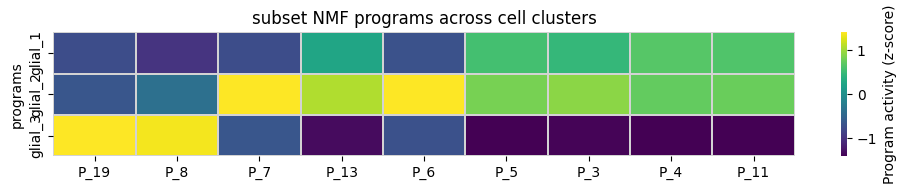

In [30]:
import seaborn as sns
import matplotlib.pyplot as plt

plt.figure(figsize=(10, 2))

sns.heatmap(
    prog_batch_z.T,
    cmap='viridis',
    center=0,
    linewidths=0.3,
    linecolor='lightgray',
    cbar_kws={'label': 'Program activity (z-score)'}
)

plt.xlabel('')
plt.ylabel('programs')
plt.title('subset NMF programs across cell clusters')

plt.tight_layout()
plt.savefig('figures/paper/Figure 6/scenicplus_out/NMF9_programs_glia_subclusters.pdf', dpi=300)
plt.show()

In [57]:
targets = scplus_mdata.uns["extended_e_regulon_metadata"][scplus_mdata.uns["extended_e_regulon_metadata"]['TF'] == 'OctVul6B025607']
targets_imp = targets[targets['importance_TF2G'] >= 0.0]
TFs = pd.DataFrame(targets_imp['Gene'].drop_duplicates())
df_2 = TFs.merge(orthos_red, how='left', left_on='Gene', right_on='O. vulgaris')
#df_2.to_csv(marker_dir + f'cluster_{cluster}')
df_2.head(40)

,Gene,O. vulgaris,H. sapiens,D. melanogaster,O. sinensis (NCBI),S. pharaonis,C. elegans
0,OctVul6B004505,OctVul6B004505,SLBP,FBgn0041186,XP_029639974.1,A0A812C607,WBGene00000411
1,OctVul6B005118,OctVul6B005118,INSM1/INSM2,FBgn0041105/ FBgn0028999,XP_029642755.1/ XP_036363517.1,A0A812BWK7,WBGene00001210
2,OctVul6B018713,OctVul6B018713,ELF2/ELF1,FBgn0000567,XP_029639583.1,A0A812CMW0,WBGene00016029
3,g.plus_peak_152897,NaN,NaN,NaN,NaN,NaN,NaN
4,OctVul6B002226,OctVul6B002226,NaN,FBgn0013983,NaN,NaN,WBGene00007985
5,OctVul6B023374,OctVul6B023374,NaN,NaN,XP_029657536.1,NaN,WBGene00001857/ WBGene00001853/ WBGene00001856...
6,OctVul6B024681,OctVul6B024681,RT10,FBgn0038307,XP_029646709.1,NaN,WBGene00012556
7,OctVul6B000666,OctVul6B000666,MAD3/MAD1/MXI1/MAD4,NaN,NaN,A0A812DRE4,WBGene00003163
8,OctVul6B007651,OctVul6B007651,NaN,NaN,XP_029649663.1,NaN,NaN
9,OctVul6B027683,OctVul6B027683,HSDL2,FBgn0039537,XP_029649957.1,A0A812BVU6,WBGene00000981/ WBGene00000970


In [58]:
targets = scplus_mdata.uns["extended_e_regulon_metadata"][scplus_mdata.uns["extended_e_regulon_metadata"]['Gene'] == 'OctVul6B025607']
targets_imp = targets[targets['importance_TF2G'] >= 0.0]
TFs = pd.DataFrame(targets_imp['TF'].drop_duplicates())
df_2 = TFs.merge(orthos_red, how='left', left_on='TF', right_on='O. vulgaris')
#df_2.to_csv(marker_dir + f'cluster_{cluster}')
df_2.head(40)

,TF,O. vulgaris,H. sapiens,D. melanogaster,O. sinensis (NCBI),S. pharaonis,C. elegans
0,OctVul6B002384,OctVul6B002384,TFDP2/TFDP3/TFDP1,FBgn0011763,XP_029634375.1,A0A812DDY7,WBGene00001061
1,OctVul6B005118,OctVul6B005118,INSM1/INSM2,FBgn0041105/ FBgn0028999,XP_029642755.1/ XP_036363517.1,A0A812BWK7,WBGene00001210
2,OctVul6B025607,OctVul6B025607,ASCL2/ASCL1,FBgn0000022/ FBgn0002561/ FBgn0000137,XP_029635173.1,A0A812B3J9,WBGene00001958
3,OctVul6B031092,OctVul6B031092,MYB/MYBA,FBgn0002914,XP_029646506.1,A0A812BQ28,NaN
4,OctVul6B030927,OctVul6B030927,GLI2/GLI3/GLI1,FBgn0004859,XP_036366432.1,NaN,WBGene00006604


In [10]:
from scenicplus import networks

In [165]:
er_metadata = scplus_obj.uns['eRegulon_metadata'].copy()

In [132]:
subset_eRegulons = 'OctVul6B025607'
#subset_eRegulons = [x + '_[^a-zA-Z0-9]' for x in subset_eRegulons]
subset_eRegulons
er_metadata = er_metadata[er_metadata['Region_signature_name'].str.contains(
            '|'.join(subset_eRegulons))]
er_metadata

,Region,Gene,importance_R2G,rho_R2G,importance_x_rho,importance_x_abs_rho,TF,is_extended,eRegulon_name,Gene_signature_name,Region_signature_name,importance_TF2G,regulation,rho_TF2G,triplet_rank
0,xcOctVulg1.1_chr11:40701915-40702415,OctVul6B002405,0.025362,0.085031,0.002157,0.002157,OctVul6B000274,False,OctVul6B000274_direct_+/+,OctVul6B000274_direct_+/+_(144g),OctVul6B000274_direct_+/+_(186r),0.318536,1,0.106035,5515
1,xcOctVulg1.1_chr05:135412487-135412987,OctVul6B005550,0.116538,0.247577,0.028852,0.028852,OctVul6B000274,False,OctVul6B000274_direct_+/+,OctVul6B000274_direct_+/+_(144g),OctVul6B000274_direct_+/+_(186r),0.562736,1,0.159901,1074
2,xcOctVulg1.1_chr23:8065257-8065757,OctVul6B005547,0.007964,0.068358,0.000544,0.000544,OctVul6B000274,False,OctVul6B000274_direct_+/+,OctVul6B000274_direct_+/+_(144g),OctVul6B000274_direct_+/+_(186r),0.595884,1,0.196229,9096
3,xcOctVulg1.1_chr02:66950137-66950637,OctVul6B000802,0.024652,0.069934,0.001724,0.001724,OctVul6B000274,False,OctVul6B000274_direct_+/+,OctVul6B000274_direct_+/+_(144g),OctVul6B000274_direct_+/+_(186r),0.337835,1,0.151260,5640
4,xcOctVulg1.1_chr04:111995545-111996045,g.plus_peak_61491,0.075505,0.094776,0.007156,0.007156,OctVul6B000274,False,OctVul6B000274_direct_+/+,OctVul6B000274_direct_+/+_(144g),OctVul6B000274_direct_+/+_(186r),1.521325,1,0.059256,4236
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10461,xcOctVulg1.1_chr24:13772976-13773476,OctVul6B027281,0.003798,-0.070573,-0.000268,0.000268,OctVul6B031322,False,OctVul6B031322_direct_-/-,OctVul6B031322_direct_-/-_(43g),OctVul6B031322_direct_-/-_(34r),0.557664,-1,-0.088806,8521
10462,xcOctVulg1.1_chr08:77821991-77822491,OctVul6B019014,0.006966,-0.057000,-0.000397,0.000397,OctVul6B031322,False,OctVul6B031322_direct_-/-,OctVul6B031322_direct_-/-_(43g),OctVul6B031322_direct_-/-_(34r),1.026581,-1,-0.108708,7528
10463,xcOctVulg1.1_chr23:45168666-45169166,OctVul6B013441,0.001100,-0.096587,-0.000106,0.000106,OctVul6B031322,False,OctVul6B031322_direct_-/-,OctVul6B031322_direct_-/-_(43g),OctVul6B031322_direct_-/-_(34r),0.609843,-1,-0.126970,10218
10464,xcOctVulg1.1_chr27:24048825-24049325,OctVul6B007541,0.015204,-0.085938,-0.001307,0.001307,OctVul6B031322,False,OctVul6B031322_direct_-/-,OctVul6B031322_direct_-/-_(43g),OctVul6B031322_direct_-/-_(34r),0.542465,-1,-0.064718,8964


In [166]:
subset_eRegulons = 'OctVul6B008109'
#subset_eRegulons = [x + '_[^a-zA-Z0-9]' for x in subset_eRegulons]
subset_eRegulons
er_metadata = er_metadata[er_metadata['Region_signature_name'].str.contains(subset_eRegulons)]
er_metadata

,Region,Gene,importance_R2G,rho_R2G,importance_x_rho,importance_x_abs_rho,TF,is_extended,eRegulon_name,Gene_signature_name,Region_signature_name,importance_TF2G,regulation,rho_TF2G,triplet_rank
2554,xcOctVulg1.1_chr12:87183309-87183809,OctVul6B021266,0.059294,0.334517,0.019835,0.019835,OctVul6B008109,False,OctVul6B008109_direct_+/+,OctVul6B008109_direct_+/+_(183g),OctVul6B008109_direct_+/+_(408r),4.314062,1,0.437048,1533
2555,xcOctVulg1.1_chr13:38202354-38202854,OctVul6B009793,0.062812,0.172740,0.010850,0.010850,OctVul6B008109,False,OctVul6B008109_direct_+/+,OctVul6B008109_direct_+/+_(183g),OctVul6B008109_direct_+/+_(408r),4.245425,1,0.232077,2344
2556,xcOctVulg1.1_chr24:26712762-26713262,OctVul6ncA446928,0.044125,0.292107,0.012889,0.012889,OctVul6B008109,False,OctVul6B008109_direct_+/+,OctVul6B008109_direct_+/+_(183g),OctVul6B008109_direct_+/+_(408r),6.181163,1,0.416983,3019
2557,xcOctVulg1.1_chr28:13395898-13396398,OctVul6B019897,0.003993,0.413454,0.001651,0.001651,OctVul6B008109,False,OctVul6B008109_direct_+/+,OctVul6B008109_direct_+/+_(183g),OctVul6B008109_direct_+/+_(408r),12.370325,1,0.482844,1321
2558,xcOctVulg1.1_chr02:166332451-166332951,OctVul6B008392,0.019098,0.454543,0.008681,0.008681,OctVul6B008109,False,OctVul6B008109_direct_+/+,OctVul6B008109_direct_+/+_(183g),OctVul6B008109_direct_+/+_(408r),7.139579,1,0.291821,752
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
17151,xcOctVulg1.1_chr02:166332451-166332951,g.MergePeak_plus_1316,0.014508,0.335228,0.004864,0.004864,OctVul6B008109,True,OctVul6B008109_extended_+/+,OctVul6B008109_extended_+/+_(244g),OctVul6B008109_extended_+/+_(601r),1.272440,1,0.215377,23133
17152,xcOctVulg1.1_chr17:60948113-60948613,OctVul6B015452,0.040835,0.199951,0.008165,0.008165,OctVul6B008109,True,OctVul6B008109_extended_+/+,OctVul6B008109_extended_+/+_(244g),OctVul6B008109_extended_+/+_(601r),3.864556,1,0.250849,1685
17153,xcOctVulg1.1_chr01:217069019-217069519,OctVul6B022884,0.022828,0.217710,0.004970,0.004970,OctVul6B008109,True,OctVul6B008109_extended_+/+,OctVul6B008109_extended_+/+_(244g),OctVul6B008109_extended_+/+_(601r),1.235068,1,0.187145,29408
17154,xcOctVulg1.1_chr25:33076519-33077019,OctVul6B020279,0.022545,0.317400,0.007156,0.007156,OctVul6B008109,True,OctVul6B008109_extended_+/+,OctVul6B008109_extended_+/+_(244g),OctVul6B008109_extended_+/+_(601r),4.725911,1,0.314534,15228


In [159]:
subset_eRegulons = ['OctVul6B025607_direct_+/+', 'OctVul6B008109_direct_+/+']
eRegulon_metadata_key = 'eRegulon_metadata'
er_metadata = scplus_obj.uns[eRegulon_metadata_key].copy()
if subset_eRegulons is not None:
    subset_eRegulons = [x + '_(^a-zA-Z0-9)' for x in subset_eRegulons]
    er_metadata = er_metadata[er_metadata['Region_signature_name'].str.contains(
         '|'.join(subset_eRegulons))]
    
subset_eRegulons

/tmp/ipykernel_425061/3127443610.py:6: UserWarning: This pattern is interpreted as a regular expression, and has match groups. To actually get the groups, use str.extract.
  er_metadata = er_metadata[er_metadata['Region_signature_name'].str.contains(


['OctVul6B025607_direct_+/+_(^a-zA-Z0-9)',
 'OctVul6B008109_direct_+/+_(^a-zA-Z0-9)']

In [168]:
import re
subset_eRegulons = ['OctVul6B025607_direct_+/+', 'OctVul6B008109_direct_+/+']
eRegulon_metadata_key = 'eRegulon_metadata'

er_metadata = scplus_obj.uns[eRegulon_metadata_key].copy()
if subset_eRegulons is not None:
    # Escape regex special characters (like '+', '/') to avoid regex errors
    subset_eRegulons_regex = [re.escape(x) + r'_' for x in subset_eRegulons]
    er_metadata = er_metadata[
        er_metadata['Region_signature_name'].str.contains('|'.join(subset_eRegulons_regex))
    ]
er_metadata

,Region,Gene,importance_R2G,rho_R2G,importance_x_rho,importance_x_abs_rho,TF,is_extended,eRegulon_name,Gene_signature_name,Region_signature_name,importance_TF2G,regulation,rho_TF2G,triplet_rank
2554,xcOctVulg1.1_chr12:87183309-87183809,OctVul6B021266,0.059294,0.334517,0.019835,0.019835,OctVul6B008109,False,OctVul6B008109_direct_+/+,OctVul6B008109_direct_+/+_(183g),OctVul6B008109_direct_+/+_(408r),4.314062,1,0.437048,1533
2555,xcOctVulg1.1_chr13:38202354-38202854,OctVul6B009793,0.062812,0.172740,0.010850,0.010850,OctVul6B008109,False,OctVul6B008109_direct_+/+,OctVul6B008109_direct_+/+_(183g),OctVul6B008109_direct_+/+_(408r),4.245425,1,0.232077,2344
2556,xcOctVulg1.1_chr24:26712762-26713262,OctVul6ncA446928,0.044125,0.292107,0.012889,0.012889,OctVul6B008109,False,OctVul6B008109_direct_+/+,OctVul6B008109_direct_+/+_(183g),OctVul6B008109_direct_+/+_(408r),6.181163,1,0.416983,3019
2557,xcOctVulg1.1_chr28:13395898-13396398,OctVul6B019897,0.003993,0.413454,0.001651,0.001651,OctVul6B008109,False,OctVul6B008109_direct_+/+,OctVul6B008109_direct_+/+_(183g),OctVul6B008109_direct_+/+_(408r),12.370325,1,0.482844,1321
2558,xcOctVulg1.1_chr02:166332451-166332951,OctVul6B008392,0.019098,0.454543,0.008681,0.008681,OctVul6B008109,False,OctVul6B008109_direct_+/+,OctVul6B008109_direct_+/+_(183g),OctVul6B008109_direct_+/+_(408r),7.139579,1,0.291821,752
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7106,xcOctVulg1.1_chr02:70768391-70768891,g.MergePeak_minus_1043,0.015251,0.149557,0.002281,0.002281,OctVul6B025607,False,OctVul6B025607_direct_+/+,OctVul6B025607_direct_+/+_(106g),OctVul6B025607_direct_+/+_(125r),2.097046,1,0.102335,6693
7107,xcOctVulg1.1_chr17:58934117-58934617,OctVul6B029939,0.007749,0.386616,0.002996,0.002996,OctVul6B025607,False,OctVul6B025607_direct_+/+,OctVul6B025607_direct_+/+_(106g),OctVul6B025607_direct_+/+_(125r),7.690772,1,0.385184,1736
7108,xcOctVulg1.1_chr07:4654297-4654797,OctVul6B018713,0.001506,0.215949,0.000325,0.000325,OctVul6B025607,False,OctVul6B025607_direct_+/+,OctVul6B025607_direct_+/+_(106g),OctVul6B025607_direct_+/+_(125r),4.725444,1,0.335812,4902
7109,xcOctVulg1.1_chr28:5257205-5257705,OctVul6B009499,0.024227,0.103660,0.002511,0.002511,OctVul6B025607,False,OctVul6B025607_direct_+/+,OctVul6B025607_direct_+/+_(106g),OctVul6B025607_direct_+/+_(125r),2.707540,1,0.122800,3799


In [81]:
"""export eRegulons to eGRN network and plot.
"""

import json
import pandas as pd
from typing import Union, Dict, Sequence, Optional, List
import anndata
import scanpy as sc
import random
import matplotlib.pyplot as plt
import matplotlib.cm as cm
import networkx as nx
from matplotlib.colors import to_rgba, to_hex
import numpy as np
from sklearn.preprocessing import MinMaxScaler, StandardScaler
import re


def _format_df_nx(df, key, var):
    """
    A helper function to format differential test results
    """
    df.index = df['names']
    df = pd.DataFrame(df['logfoldchanges'])
    df.columns = [var+'_Log2FC_'+key]
    df.index.name = None
    return df


def _get_log2fc_nx(scplus_obj: 'SCENICPLUS',
                  variable,
                  features,
                  contrast: Optional[str] = 'gene'
                  ):
    """
    A helper function to derive log2fc changes
    """
    if contrast == 'gene':
        adata = anndata.AnnData(X=scplus_obj.X_EXP, obs=pd.DataFrame(
            index=scplus_obj.cell_names), var=pd.DataFrame(index=scplus_obj.gene_names))
    if contrast == 'region':
        adata = anndata.AnnData(X=scplus_obj.X_ACC.T, obs=pd.DataFrame(
            index=scplus_obj.cell_names), var=pd.DataFrame(index=scplus_obj.region_names))
    adata.obs = pd.DataFrame(scplus_obj.metadata_cell[variable])
    sc.pp.normalize_total(adata, target_sum=1e4)
    sc.pp.log1p(adata)
    adata = adata[:, features]
    sc.tl.rank_genes_groups(
        adata, variable, method='wilcoxon', corr_method='bonferroni')
    groups = adata.uns['rank_genes_groups']['names'].dtype.names
    diff_list = [_format_df_nx(sc.get.rank_genes_groups_df(
        adata, group=group), group, variable) for group in groups]
    return pd.concat(diff_list, axis=1)





def create_nx_tables(scplus_obj: 'SCENICPLUS',
                     eRegulon_metadata_key: str ='eRegulon_metadata',
                     subset_eRegulons: List = None,
                     subset_regions: List = None,
                     subset_genes: List = None,
                     add_differential_gene_expression: bool = False,
                     add_differential_region_accessibility: bool = False,
                     differential_variable: List =[]):
    """
    A function to format eRegulon data into tables for plotting eGRNs.
    
    Parameters
    ---------
    scplus_obj: SCENICPLUS
        A SCENICPLUS object with eRegulons
    eRegulon_metadata_key: str, optional
        Key where the eRegulon metadata dataframe is stored
    subset_eRegulons: list, optional
        List of eRegulons to subset
    subset_regions: list, optional
        List of regions to subset
    subset_genes: list, optional
        List of genes to subset
    add_differential_gene_expression: bool, optional
        Whether to calculate differential gene expression logFC for a given variable
    add_differential_region_accessibility: bool, optional
        Whether to calculate differential region accessibility logFC for a given variable
    differential_variable: list, optional
        Variable to calculate differential gene expression or region accessibility.
        
    Return
    ---------
    A dictionary with edge feature tables ('TF2G', 'TF2R', 'R2G') and node feature tables ('TF', 'Gene', 'Region')
    """
    er_metadata = scplus_obj.uns[eRegulon_metadata_key].copy()
    if subset_eRegulons is not None:
        # Escape regex special characters (like '+', '/') to avoid regex errors
        subset_eRegulons_regex = [re.escape(x) + r'_' for x in subset_eRegulons]
        er_metadata = er_metadata[
            er_metadata['Region_signature_name'].str.contains('|'.join(subset_eRegulons_regex))]
    if subset_regions is not None:
        er_metadata = er_metadata[er_metadata['Region'].isin(subset_regions)]
    if subset_genes is not None:
        er_metadata = er_metadata[er_metadata['Gene'].isin(subset_genes)]
    nx_tables = {}
    nx_tables['Edge'] = {}
    nx_tables['Node'] = {}
    # Generate edge tables
    r2g_columns = [x for x in er_metadata.columns if 'R2G' in x]
    tf2g_columns = [x for x in er_metadata.columns if 'TF2G' in x]
    nx_tables['Edge']['TF2R'] = er_metadata[er_metadata.columns.difference(
        r2g_columns + tf2g_columns)].drop('Gene', axis=1).drop_duplicates()
    nx_tables['Edge']['TF2R'] = nx_tables['Edge']['TF2R'][['TF', 'Region'] +
                                                          nx_tables['Edge']['TF2R'].columns.difference(['TF', 'Region']).tolist()]
    nx_tables['Edge']['R2G'] = er_metadata[er_metadata.columns.difference(
        tf2g_columns)].drop('TF', axis=1).drop_duplicates()
    nx_tables['Edge']['R2G'] = nx_tables['Edge']['R2G'][['Region', 'Gene'] +
                                                        nx_tables['Edge']['R2G'].columns.difference(['Region', 'Gene']).tolist()]
    nx_tables['Edge']['TF2G'] = er_metadata[er_metadata.columns.difference(
        r2g_columns)].drop('Region', axis=1).drop_duplicates()
    nx_tables['Edge']['TF2G'] = nx_tables['Edge']['TF2G'][['TF', 'Gene'] +
                                                          nx_tables['Edge']['TF2G'].columns.difference(['TF', 'Gene']).tolist()]
    # Generate node tables
    tfs = list(set(er_metadata['TF']))
    nx_tables['Node']['TF'] = pd.DataFrame(
        'TF', index=tfs, columns=['Node_type'])
    nx_tables['Node']['TF']['TF'] = tfs
    genes = list(set(er_metadata['Gene']))
    genes = [x for x in genes if x not in tfs]
    nx_tables['Node']['Gene'] = pd.DataFrame(
        'Gene', index=genes, columns=['Node_type'])
    nx_tables['Node']['Gene']['Gene'] = genes
    regions = list(set(er_metadata['Region']))
    nx_tables['Node']['Region'] = pd.DataFrame(
        'Region', index=regions, columns=['Node_type'])
    nx_tables['Node']['Region']['Region'] = regions
    # Add gene logFC
    if add_differential_gene_expression is True:
        for var in differential_variable:
            nx_tables['Node']['TF'] = pd.concat([nx_tables['Node']['TF'], _get_log2fc_nx(
                scplus_obj, var, nx_tables['Node']['TF'].index.tolist(), contrast='gene')], axis=1)
            nx_tables['Node']['Gene'] = pd.concat([nx_tables['Node']['Gene'], _get_log2fc_nx(
                scplus_obj, var, nx_tables['Node']['Gene'].index.tolist(), contrast='gene')], axis=1)
    if add_differential_region_accessibility is True:
        for var in differential_variable:
            nx_tables['Node']['Region'] = pd.concat([nx_tables['Node']['Region'], _get_log2fc_nx(
                scplus_obj, var, nx_tables['Node']['Region'].index.tolist(), contrast='region')], axis=1)
    return nx_tables




def _format_nx_table_internal(nx_tables, table_type, table_id, color_by={}, transparency_by={}, size_by={}, shape_by={}, label_size_by={}, label_color_by={}):
    """
    A helper function to format edge and node tables into graphs
    """
    nx_tb = nx_tables[table_type][table_id]
    # Color
    if table_id in color_by.keys():
        if 'fixed_color' not in color_by[table_id].keys():
            color_var = nx_tables[table_type][table_id][color_by[table_id]['variable']]
            if 'category_color' in color_by[table_id].keys():
                if color_by[table_id]['category_color'] is None:
                    random.seed(555)
                    categories = set(color_var)
                    color = list(map(
                        lambda i: "#" +
                        "%06x" % random.randint(
                            0, 0xFFFFFF), range(len(categories))
                    ))
                    color_dict = dict(zip(categories, color))
                else:
                    color_dict = color_by[table_id]['category_color']
                color = color_var.apply(
                    lambda x: to_rgba(color_dict[x])).to_numpy()
            elif 'continuous_color' in color_by[table_id].keys():
                if color_by[table_id]['continuous_color'] is None:
                    color_map = 'viridis'
                else:
                    color_map = color_by[table_id]['continuous_color']
                if 'v_min' in color_by[table_id].keys():
                    v_min = color_by[table_id]['v_min']
                else:
                    v_min = None
                if 'v_max' in color_by[table_id].keys():
                    v_max = color_by[table_id]['v_max']
                else:
                    v_max = None
                color = _get_colors(color_var, color_map, v_min, v_max)
        else:
            color = np.array([color_by[table_id]['fixed_color']]
                             * nx_tables[table_type][table_id].shape[0])
    else:
        color = np.array([to_rgba('grey')] *
                         nx_tables[table_type][table_id].shape[0])

    # Transparency
    if table_id in transparency_by.keys():
        if 'fixed_alpha' not in transparency_by[table_id]['variable']:
            transparency_var = nx_tables[table_type][table_id][transparency_by[table_id]['variable']]
            if 'v_min' in transparency_by[table_id].keys():
                v_min = transparency_by[table_id]['v_min']
            else:
                v_min = None
            if 'v_max' in transparency_by[table_id].keys():
                v_max = transparency_by[table_id]['v_max']
            else:
                v_max = None
            if 'min_alpha' in transparency_by[table_id].keys():
                min_alpha = transparency_by[table_id]['min_alpha']
            else:
                min_alpha = 0.5
            norm = plt.Normalize(v_min, v_max)
            x = norm(transparency_var)
            x[x < min_alpha] = min_alpha
            for i in range(0, len(color)):
                c = list(color[i])
                c[-1] = x[i]
                color[i] = tuple(c)
            #color[:, -1] = x
        else:
            for i in range(0, len(color)):
                c = list(color[i])
                c[-1] = transparency_by[table_id]['fixed_alpha']
                color[i] = tuple(c)


    # Size/Width
    if table_id in size_by.keys():
        if 'fixed_size' not in size_by[table_id].keys():
            sw_var = nx_tables[table_type][table_id][size_by[table_id]
                                                     ['variable']].to_numpy().flatten('F')
            if 'min_size' in size_by[table_id].keys():
                p_min = size_by[table_id]['min_size']
            else:
                p_min = 3
            if 'max_size' in size_by[table_id].keys():
                p_max = size_by[table_id]['max_size']
            else:
                p_max = 10
            s_min = sw_var[sw_var != 0].min()
            s_max = sw_var.max()
            sw_var[sw_var != 0] = p_min + \
                (sw_var[sw_var != 0] - s_min) * \
                ((p_max - p_min) / (s_max - s_min))
        else:
            sw_var = [size_by[table_id]['fixed_size']] * \
                nx_tables[table_type][table_id].shape[0]
    else:
        sw_var = [1] * nx_tables[table_type][table_id].shape[0]

    # Node shape
    if table_id in shape_by.keys():
        if 'fixed_shape' not in shape_by[table_id].keys():
            if not 'categorical_shape' in shape_by[table_id].keys():
                print(
                    'No categorical_shape dictionary provided, making all nodes circular!')
                shape_var = ['circular'] * \
                    nx_tables[table_type][table_id].shape[0]
            else:
                shape_dict = shape_by[table_id]['categorical_shape']
                shape_var = shape_var.apply(lambda x: shape_dict[x]).to_numpy()
        else:
            shape_var = np.array(
                [shape_by[table_id]['fixed_shape']]*nx_tables[table_type][table_id].shape[0])
    else:
        shape_var = ['ellipse'] * nx_tables[table_type][table_id].shape[0]

    # Label size
    if table_id in label_size_by.keys():
        if 'fixed_label_size' not in label_size_by[table_id].keys():
            if not 'categorical_label_size' in label_size_by[table_id].keys():
                print(
                    'categorical_label_size dictionary provided, using size 14 for all nodes!')
                label_size_var = 14 * nx_tables[table_type][table_id].shape[0]
            else:
                label_size_dict = label_size_by[table_id]['categorical_label_size']
                label_size_var = label_size_var.apply(
                    lambda x: label_size_var[x]).to_numpy()
        else:
            label_size_var = np.array(
                [label_size_by[table_id]['fixed_label_size']]*nx_tables[table_type][table_id].shape[0])
    else:
        label_size_var = [14] * nx_tables[table_type][table_id].shape[0]

    # Label color
    if table_id in label_color_by.keys():
        if 'fixed_label_color' not in label_color_by[table_id].keys():
            if not 'categorical_label_color' in label_color_by[table_id].keys():
                print(
                    'categorical_label_color dictionary provided, using black for all nodes!')
                label_color_var = np.array(
                    [to_rgba('black')]*nx_tables[table_type][table_id].shape[0])
            else:
                label_color_dict = label_color_by[table_id]['categorical_label_color']
                label_color_var = label_color_var.apply(
                    lambda x: to_rgba(label_color_var[x])).to_numpy()
        else:
            label_color_var = np.array(
                [label_color_by[table_id]['fixed_label_color']]*nx_tables[table_type][table_id].shape[0])
    else:
        label_color_var = np.array(
            [to_rgba('black')]*nx_tables[table_type][table_id].shape[0])

    color = [to_hex(x, keep_alpha=True) for x in color]
    label_color_var = [to_hex(x, keep_alpha=True) for x in label_color_var]
    if table_type == 'Edge':
        dt1 = nx_tb.iloc[:, 0:2].reset_index(drop=True)
        dt2 = pd.DataFrame([color, sw_var]).T.reset_index(drop=True)
    else:
        dt1 = nx_tb.iloc[:, 0:2].reset_index(drop=True)
        dt2 = pd.DataFrame([color, sw_var, shape_var, label_size_var,
                           label_color_var]).T.reset_index(drop=True)

    dt = pd.concat([dt1, dt2], axis=1)
    color = dt.iloc[:,2]
    dt['color_rgb'] = [to_hex(to_rgba(x)) for x in color]
    dt['color_alpha'] = [to_rgba(x)[3] for x in color]
    scaler = MinMaxScaler(feature_range=(200,255))
    dt['color_alpha'] = scaler.fit_transform(np.array(dt['color_alpha']).reshape(-1,1))
    if len(set(dt['color_alpha'])) == 1:
        dt['color_alpha'] = [255]*dt.shape[0]
    if table_type == 'Edge':
        dt.columns = ['source', 'target', 'color', 'width', 'color_rgb', 'color_alpha']
    else:
        color = dt.iloc[:,6]
        dt['font_color_rgb'] = [to_hex(to_rgba(x)) for x in color]
        dt['font_color_alpha'] = [to_rgba(x)[3] for x in color]
        dt['font_color_alpha'] = scaler.fit_transform(np.array(dt['font_color_alpha']).reshape(-1,1))
        if len(set(dt['font_color_alpha'])) == 1:
            dt['font_color_alpha'] = [255]*dt.shape[0]
        dt.columns = ['group', 'label', 'color',
                      'size', 'shape', 'font_size', 'font_color', 'color_rgb', 'color_alpha',
                      'font_color_rgb', 'font_color_alpha']
    return dt


def _get_colors(inp, cmap_name, vmin=None, vmax=None):
    """
    A function to get color values from a continuous vector and a color map
    """
    color_map = cm.get_cmap(cmap_name)
    norm = plt.Normalize(vmin, vmax)
    return color_map(norm(inp))


In [3]:
dic = create_nx_tables(scplus_obj = scplus_obj,
                eRegulon_metadata_key = 'eRegulon_metadata', 
                subset_eRegulons = ['OctVul6B025607', 'OctVul6B008109'],
                #subset_regions: List = None, 
                #subset_genes = [], 
                #add_differential_gene_expression = True, 
                #add_differential_region_accessibility = True, 
                #differential_variable = ['OctVul6B025607']
                )




In [4]:
dic['Edge'].keys()

dict_keys(['TF2R', 'R2G', 'TF2G'])

In [5]:
dic['Edge']['TF2G']

,TF,Gene,Gene_signature_name,Region_signature_name,eRegulon_name,importance_TF2G,importance_x_abs_rho,importance_x_rho,is_extended,regulation,rho_TF2G,triplet_rank
2554,OctVul6B008109,OctVul6B021266,OctVul6B008109_direct_+/+_(183g),OctVul6B008109_direct_+/+_(408r),OctVul6B008109_direct_+/+,4.314062,0.019835,0.019835,False,1,0.437048,1533
2555,OctVul6B008109,OctVul6B009793,OctVul6B008109_direct_+/+_(183g),OctVul6B008109_direct_+/+_(408r),OctVul6B008109_direct_+/+,4.245425,0.010850,0.010850,False,1,0.232077,2344
2556,OctVul6B008109,OctVul6ncA446928,OctVul6B008109_direct_+/+_(183g),OctVul6B008109_direct_+/+_(408r),OctVul6B008109_direct_+/+,6.181163,0.012889,0.012889,False,1,0.416983,3019
2557,OctVul6B008109,OctVul6B019897,OctVul6B008109_direct_+/+_(183g),OctVul6B008109_direct_+/+_(408r),OctVul6B008109_direct_+/+,12.370325,0.001651,0.001651,False,1,0.482844,1321
2558,OctVul6B008109,OctVul6B008392,OctVul6B008109_direct_+/+_(183g),OctVul6B008109_direct_+/+_(408r),OctVul6B008109_direct_+/+,7.139579,0.008681,0.008681,False,1,0.291821,752
...,...,...,...,...,...,...,...,...,...,...,...,...
47094,OctVul6B025607,OctVul6B022334,OctVul6B025607_extended_+/+_(84g),OctVul6B025607_extended_+/+_(92r),OctVul6B025607_extended_+/+,3.500870,0.000124,0.000124,True,1,0.225090,31168
47095,OctVul6B025607,OctVul6B007651,OctVul6B025607_extended_+/+_(84g),OctVul6B025607_extended_+/+_(92r),OctVul6B025607_extended_+/+,13.122967,0.000197,0.000197,True,1,0.578892,5521
47096,OctVul6B025607,OctVul6B006427,OctVul6B025607_extended_+/+_(84g),OctVul6B025607_extended_+/+_(92r),OctVul6B025607_extended_+/+,5.742592,0.024516,0.024516,True,1,0.325955,801
47097,OctVul6B025607,OctVul6B012445,OctVul6B025607_extended_+/+_(84g),OctVul6B025607_extended_+/+_(92r),OctVul6B025607_extended_+/+,2.212437,0.014833,0.014833,True,1,0.190338,1045


In [6]:
dic['Edge']['TF2R']

,TF,Region,Gene_signature_name,Region_signature_name,eRegulon_name,importance_x_abs_rho,importance_x_rho,is_extended,regulation,triplet_rank
2554,OctVul6B008109,xcOctVulg1.1_chr12:87183309-87183809,OctVul6B008109_direct_+/+_(183g),OctVul6B008109_direct_+/+_(408r),OctVul6B008109_direct_+/+,0.019835,0.019835,False,1,1533
2555,OctVul6B008109,xcOctVulg1.1_chr13:38202354-38202854,OctVul6B008109_direct_+/+_(183g),OctVul6B008109_direct_+/+_(408r),OctVul6B008109_direct_+/+,0.010850,0.010850,False,1,2344
2556,OctVul6B008109,xcOctVulg1.1_chr24:26712762-26713262,OctVul6B008109_direct_+/+_(183g),OctVul6B008109_direct_+/+_(408r),OctVul6B008109_direct_+/+,0.012889,0.012889,False,1,3019
2557,OctVul6B008109,xcOctVulg1.1_chr28:13395898-13396398,OctVul6B008109_direct_+/+_(183g),OctVul6B008109_direct_+/+_(408r),OctVul6B008109_direct_+/+,0.001651,0.001651,False,1,1321
2558,OctVul6B008109,xcOctVulg1.1_chr02:166332451-166332951,OctVul6B008109_direct_+/+_(183g),OctVul6B008109_direct_+/+_(408r),OctVul6B008109_direct_+/+,0.008681,0.008681,False,1,752
...,...,...,...,...,...,...,...,...,...,...
47094,OctVul6B025607,xcOctVulg1.1_chr06:131889321-131889821,OctVul6B025607_extended_+/+_(84g),OctVul6B025607_extended_+/+_(92r),OctVul6B025607_extended_+/+,0.000124,0.000124,True,1,31168
47095,OctVul6B025607,xcOctVulg1.1_chr22:43244322-43244822,OctVul6B025607_extended_+/+_(84g),OctVul6B025607_extended_+/+_(92r),OctVul6B025607_extended_+/+,0.000197,0.000197,True,1,5521
47096,OctVul6B025607,xcOctVulg1.1_chr02:205115898-205116398,OctVul6B025607_extended_+/+_(84g),OctVul6B025607_extended_+/+_(92r),OctVul6B025607_extended_+/+,0.024516,0.024516,True,1,801
47097,OctVul6B025607,xcOctVulg1.1_chr18:6781539-6782039,OctVul6B025607_extended_+/+_(84g),OctVul6B025607_extended_+/+_(92r),OctVul6B025607_extended_+/+,0.014833,0.014833,True,1,1045


In [7]:
dic['Node']['Gene']

,Node_type,Gene
OctVul6B007947,Gene,OctVul6B007947
OctVul6B007224,Gene,OctVul6B007224
OctVul6B012074,Gene,OctVul6B012074
OctVul6B020091,Gene,OctVul6B020091
OctVul6B005823,Gene,OctVul6B005823
...,...,...
OctVul6B014841,Gene,OctVul6B014841
OctVul6B010051,Gene,OctVul6B010051
g.plus_peak_41675,Gene,g.plus_peak_41675
OctVul6B022420,Gene,OctVul6B022420


In [92]:
dic['Node'].keys()

dict_keys(['TF', 'Gene', 'Region'])

In [96]:
node_tables.keys()

Index(['group', 'label', 'color', 'size', 'shape', 'font_size', 'font_color',
       'color_rgb', 'color_alpha', 'font_color_rgb', 'font_color_alpha'],
      dtype='object')

In [ ]:
def create_nx_graph(nx_tables: Dict,
                    use_edge_tables: List = ['TF2R', 'R2G'],
                    color_edge_by: Dict ={},
                    transparency_edge_by: Dict ={},
                    width_edge_by: Dict = {},
                    color_node_by: Dict = {},
                    transparency_node_by: Dict = {},
                    size_node_by: Dict = {},
                    shape_node_by: Dict = {},
                    label_size_by: Dict = {},
                    label_color_by: Dict = {},
                    layout: str = 'concentrical_layout',
                    lc_dist_genes: float = 0.8,
                    lc_dist_TF: float = 0.1,
                    scale_position_by: float = 250):
    """
    Format node/edge feature tables into a graph
    
    Parameters
    ---------
    nx_tables: Dict
        Dictionary with node/edge feature tables as produced by `create_nx_tables`
    use_edge_tables: List, optional
        List of edge tables to use
    color_edge_by: Dict, optional
        A dictionary containing for a given edge key the variable and color map to color edges by.
        If the variable is categorical, the entry 'categorical_color' can be provided as a dictionary with
        category: color. If it is a continuous variable a color map can be provided as `continuous_color` and
        entried v_max and v_min can be provided to control the min and max values of the scale. Alternatively,
        one fixed color can use by using 'fixed_color' as variable, alterntively adding an entry fixed_color: color
        to the dictionary.
    transparency_edge_by: Dict, optional
        A dictionary containing for a given edge key the variable and the max and min alpha values. The variable
        name has to be provided (only continuous variables accepted), together with v_max/v_mix parameters if
        desired. Alternatively, one fixed alpha can use by using 'fixed_alpha' as variable, alterntively adding an
        entry fixed_alpha: size to the dictionary.
    width_edge_by: Dict, optional
        A dictionary containing for a given edge key the variable and the max and min sizes. The variable
        name has to be provided (only continuous variables accepted), together with max_size/min_size parameters if
        desired. Alternatively, one fixed size can use by using 'fixed_size' as variable, alterntively adding an
        entry fixed_size: size to the dictionary.
    color_node_by: Dict, optional
        A dictionary containing for a given node key the variable and color map to color edges by.
        If the variable is categorical, the entry 'categorical_color' can be provided as a dictionary with
        category: color. If it is a continuous variable a color map can be provided as `continuous_color` and
        entried v_max and v_min can be provided to control the min and max values of the scale. Alternatively,
        one fixed color can use by using 'fixed_color' as variable, alterntively adding an entry fixed_color: color
        to the dictionary.
    transparency_node_by: Dict, optional
        A dictionary containing for a given node key the variable and the max and min alpha values. The variable
        name has to be provided (only continuous variables accepted), together with v_max/v_mix parameters if
        desired. Alternatively, one fixed alpha can use by using 'fixed_alpha' as variable, alterntively adding an
        entry fixed_alpha: size to the dictionary.
    size_node_by: Dict, optional
        A dictionary containing for a given node key the variable and the max and min sizes. The variable
        name has to be provided (only continuous variables accepted), together with max_size/min_size parameters if
        desired. Alternatively, one fixed size can use by using 'fixed_size' as variable, alterntively adding an
        entry fixed_size: size to the dictionary.
    shape_node_by: Dict, optional
        A dictionary containing for a given node key the variable and shapes. The variable
        name has to be provided (only categorical variables accepted). Alternatively, one fixed shape can use by
        using 'fixed_shape' as variable, alterntively adding an entry fixed_shape: size to the dictionary.
    label_size_by: Dict, optional
        A dictionary containing for a given node key the variable and the max and min sizes. The variable
        name has to be provided (only continuous variables accepted), together with max_size/min_size parameters if
        desired. Alternatively, one fixed size can use by using 'fixed_label_size' as variable, alterntively adding an
        entry fixed_label_size: size to the dictionary.
    label_color_by: Dict, optional
        A dictionary containing for a given node key the variable and a color dictionary. The variable
        name has to be provided (only categorical variables accepted), together with a color dictionary if
        desired. Alternatively, one fixed color can use by using 'fixed_label_color' as variable, alterntively adding an
        entry fixed_label_color: size to the dictionary.
    layout: str, optional
        Layout to use. Options are: 'concentrical_layout' (SCENIC+ custom layout) or kamada_kawai_layout (from networkx).
    lc_dist_genes: float, optional
        Distance between regions and genes. Only used if using concentrical_layout.
    lc_dist_TF: float, optional
        Distance between TF and regions. Only used if using concentrical_layout.
    scale_position_by: int, optional
        Value to scale positions for visualization in pyvis.
        
    Return
    ---------
    A networkx graph, positions, and node/edges feature tables.
    """
    # Get node table names
    use_node_tables = []
    if 'TF2R' in use_edge_tables:
        use_node_tables = ['TF', 'Region'] + use_node_tables
    if 'TF2G' in use_edge_tables:
        use_node_tables = ['TF', 'Gene'] + use_node_tables
    if 'R2G' in use_edge_tables:
        use_node_tables = ['Region', 'Gene'] + use_node_tables
    use_node_tables = sorted(list(set(use_node_tables)), reverse=True)

    # Create graph
    edge_tables = pd.concat([_format_nx_table_internal(
        nx_tables, 'Edge', x, color_edge_by, transparency_edge_by, width_edge_by, {}) for x in use_edge_tables])
    edge_tables.dropna(axis = 0, how = 'any', inplace = True)
    G = nx.from_pandas_edgelist(edge_tables, edge_attr=True)
    # Add node tables
    node_tables = pd.concat([_format_nx_table_internal(nx_tables, 'Node', x, color_node_by, transparency_node_by,
                            size_node_by, shape_node_by, label_size_by, label_color_by) for x in use_node_tables])
    node_tables.index = node_tables['label']
    node_tables.dropna(axis = 0, how = 'any', inplace = True)
    node_tables_d = node_tables.to_dict()
    for key in node_tables_d.keys():
            nx.set_node_attributes(G, node_tables_d[key], name=key)
    nx.set_node_attributes(G, node_tables_d['label'], name='title')
    font_nt_d = node_tables[['font_size', 'font_color']]
    font_nt_d.columns = ['size', 'color']
    font_nt_d = font_nt_d.to_dict(orient='index')
    nx.set_node_attributes(G, font_nt_d, name='font')
    if layout == 'concentrical_layout':
        pos = concentrical_layout(G, dist_genes=lc_dist_genes, dist_TF=lc_dist_TF)
    else:
        pos = nx.kamada_kawai_layout(G)
        
    x_pos_dict = {x:pos[x][0]*scale_position_by for x in pos.keys() if not np.isnan(pos[x][0])}
    y_pos_dict = {x:pos[x][1]*scale_position_by for x in pos.keys() if not np.isnan(pos[x][0])}
    fixed_dict = {x:{'fixed.x': True, 'fixed.y': True} for x in pos.keys()}
    nx.set_node_attributes(G, x_pos_dict, name='x')
    nx.set_node_attributes(G, y_pos_dict, name='y')
    nx.set_node_attributes(G, fixed_dict, name='fixed')
        
    return G, pos, edge_tables, node_tables

In [107]:
use_edge_tables = ['TF2G', 'TF2R', 'R2G']
use_node_tables = []
if 'TF2R' in use_edge_tables:
    use_node_tables = ['TF', 'Region'] + use_node_tables
if 'TF2G' in use_edge_tables:
    use_node_tables = ['TF', 'Gene'] + use_node_tables
if 'R2G' in use_edge_tables:
    use_node_tables = ['Region', 'Gene'] + use_node_tables
    
use_node_tables

['Region', 'Gene', 'TF', 'Gene', 'TF', 'Region']

In [108]:
use_node_tables = sorted(list(set(use_node_tables)), reverse=True)
use_node_tables

['TF', 'Region', 'Gene']

In [139]:
nx_tables['Edge'].keys()

dict_keys(['TF2R', 'R2G', 'TF2G'])

In [151]:
use_edge_tables = ['TF2G', 'TF2R', 'R2G']
nx_tables = dic
color_edge_by = {'TF': '#386cb0',
                 'Region': '#fdc086',
                 'Gene': '#beaed4',
                 'color_rgb': '#386cb0',
                 'TF2G': '#7fc97f',
                 'Edge': {
                     'TF2G': '#blue',
                     'TF': '#blue',
                     'R2G': 'blue'
                 }
                }

transparency_edge_by = {'TF': 0.5,
                        'Region': 0.5,
                        'Gene': 0.5
                        }
width_edge_by = {'TF': 5,
                 'Region': 5,
                 'Gene': 5
                }

# Create graph
edge_tables = pd.concat([_format_nx_table_internal(
    nx_tables, 'Edge', x, color_edge_by, transparency_edge_by, width_edge_by, {}) for x in use_edge_tables])
edge_tables


#edge_tables.dropna(axis = 0, how = 'any', inplace = True)
#G = nx.from_pandas_edgelist(edge_tables, edge_attr=True)

AttributeError: 'str' object has no attribute 'keys'

In [153]:
dic['Node'].keys()

dict_keys(['TF', 'Gene', 'Region'])

In [172]:
color_by = {'Edge': {
    'TF2G': '#beaed4',
    'TF2R': '#7fc97f',
    'R2G': '#fdc086'
                    },
            'Node': {
                'TF': '#fdc086',
                'Gene': '#beaed4',
                'Region':  '#fdc086'
            }
           }


color_by_new = {
    'TF2G': '#beaed4',
    'TF2R': '#7fc97f',
    'R2G': '#fdc086',
    'TF': '#fdc086',
    'Gene': '#beaed4',
    'Region':  '#fdc086' 
           }

color_by_new_new = {
    'Edge': 'category_color',
    'TF2R': '#7fc97f',
    'R2G': '#fdc086',
    'TF': 1,
    'Gene': '#beaed4',
    'Region':  '#fdc086' 
           }

In [171]:
# Color
color_by=color_by_new_new
table_type='Edge'
table_id='TF2G'

color_var = nx_tables[table_type][table_id][color_by[table_id]['variable']]
color_var

TypeError: string indices must be integers, not 'str'

In [150]:
color_by

{'TF': '#386cb0',
 'Region': '#fdc086',
 'Gene': '#beaed4',
 'color_rgb': '#386cb0',
 'Edge': {'TF2G': '#blue', 'TF': '#blue', 'R2G': 'blue'}}

In [149]:
color_var = nx_tables[table_type][table_id][color_by[table_id]['variable']]
color_var

KeyError: 'TF2G'